In [104]:
import pandas as pd
import plotly
import plotly.express as px
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [105]:
df = pd.read_csv('Data/sber_data.csv', sep=',')

In [106]:
df.head()


,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
0,1,43,27.0,4.0,Bibirevo,5001.0,5,11065.0,5,0,...,0.637189,0.947962,0.177975,0.625783,0.628187,14.053047,7.389498,good,0,5850000
1,2,34,19.0,3.0,Nagatinskij Zaton,3119.0,5,6237.0,8,0,...,0.688796,1.072315,0.273345,0.967821,0.471447,6.829889,0.709260,excellent,0,6000000
2,3,43,29.0,2.0,Tekstil'shhiki,1463.0,4,5580.0,7,0,...,1.543049,0.391957,0.158072,3.178751,0.755946,4.273200,3.156423,poor,0,5700000
3,4,89,50.0,9.0,Mitino,6839.0,9,17063.0,10,0,...,0.934273,0.892674,0.236455,1.031777,1.561505,16.990677,16.041521,good,0,13100000
4,5,77,77.0,4.0,Basmannoe,3240.0,7,7770.0,9,0,...,0.077901,0.810801,0.376838,0.378756,0.121681,1.112486,1.800125,excellent,0,16331452


In [107]:
df.tail()

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
30466,30469,44,27.0,7.0,Otradnoe,5088.0,4,12721.0,4,0,...,1.103579,0.167718,0.349899,1.235066,0.612359,7.482165,4.836787,good,0,7400000
30467,30470,86,59.0,3.0,Tverskoe,1874.0,4,6772.0,4,1,...,0.069986,0.086552,0.362681,0.850385,0.310021,0.778428,1.450108,poor,0,25000000
30468,30471,45,NaN,10.0,Poselenie Vnukovskoe,NaN,0,NaN,0,0,...,4.338453,1.339078,1.234235,1.192543,1.186621,13.459593,9.890758,no data,0,6970959
30469,30472,64,32.0,5.0,Obruchevskoe,2372.0,6,6083.0,8,0,...,1.204798,1.340017,0.130667,1.644053,0.476021,2.088193,4.119706,satisfactory,0,13500000
30470,30473,43,28.0,1.0,Novogireevo,2215.0,4,5824.0,4,0,...,2.108265,0.825811,0.378950,0.480531,0.867332,0.688707,0.127867,poor,0,5600000


In [108]:
df.shape

(30471, 61)

In [109]:
df['sub_area'].nunique()

146

In [110]:
df['price_doc'].max()

111111112

In [111]:
fig = px.box(
    df,
    y = "ecology",
    x = "price_doc",
    title = "-"
)
fig.show()

In [112]:
fig = px.scatter(
    df,
    x='kremlin_km' ,
    y='price_doc'
)
fig.show()

In [113]:
df.isnull().tail()

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
30466,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
30467,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
30468,False,False,True,False,False,True,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
30469,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
30470,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [114]:
cols_null_percent = df.isnull().mean()*100
cols_with_null = cols_null_percent[cols_null_percent>0].sort_values(ascending=False)
cols_with_null

hospital_beds_raion          47.392603
preschool_quota              21.948738
school_quota                 21.938893
life_sq                      20.947786
floor                         0.548062
metro_min_walk                0.082045
metro_km_walk                 0.082045
railroad_station_walk_km      0.082045
railroad_station_walk_min     0.082045
dtype: float64

<AxesSubplot:title={'center':'Распределение пропусков данных'}>

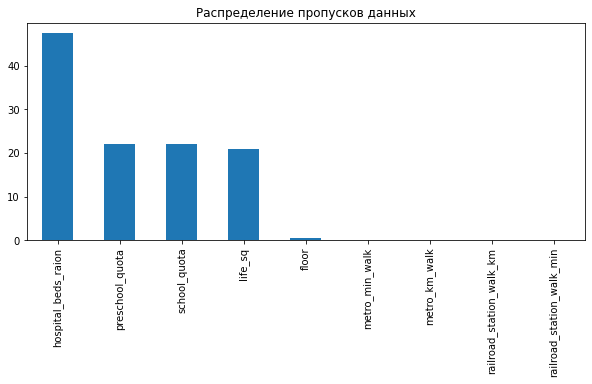

In [115]:
cols_with_null.plot(
    kind='bar',
    figsize=(10,4),
    title='Распределение пропусков данных'
)

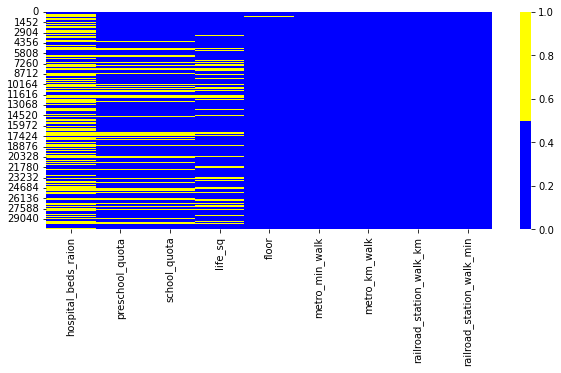

In [116]:
colors = ['blue','yellow']
fig = plt.figure(figsize=(10,4))
cols = cols_with_null.index
ax = sns.heatmap(
    df[cols].isnull(),
    cmap=sns.color_palette(colors)
)

In [117]:
drop_data = df.copy()
thresh = drop_data.shape[0]*0.7
drop_data = drop_data.dropna(how='any', thresh=thresh, axis=1)
drop_data = drop_data.dropna(how='any', axis=0)
drop_data.isnull().mean()

id                                       0.0
full_sq                                  0.0
life_sq                                  0.0
floor                                    0.0
sub_area                                 0.0
preschool_quota                          0.0
preschool_education_centers_raion        0.0
school_quota                             0.0
school_education_centers_raion           0.0
school_education_centers_top_20_raion    0.0
healthcare_centers_raion                 0.0
university_top_20_raion                  0.0
sport_objects_raion                      0.0
additional_education_raion               0.0
culture_objects_top_25_raion             0.0
shopping_centers_raion                   0.0
office_raion                             0.0
oil_chemistry_raion                      0.0
railroad_terminal_raion                  0.0
nuclear_reactor_raion                    0.0
metro_min_avto                           0.0
metro_km_avto                            0.0
metro_min_

In [118]:
drop_data.shape

(20888, 60)

# Заполнение недостающих значений

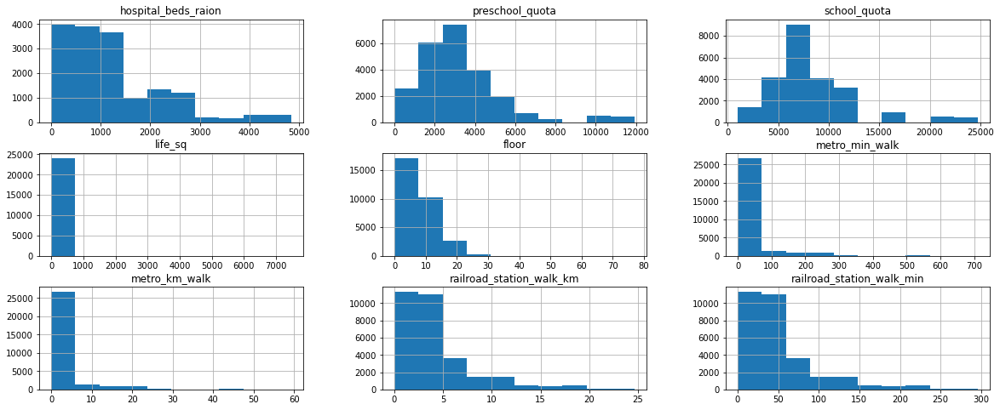

In [119]:
cols = cols_with_null.index
df[cols].hist(figsize=(20,8));

In [120]:
fill_data = df.copy() #bad_example
values = {
    'life_sq' : fill_data['full_sq'],
    'metro_min_walk' : fill_data['metro_min_walk'].median(),
    'metro_km_walk' : fill_data['metro_km_walk'].median(),
    'railroad_station_walk_km' : fill_data['railroad_station_walk_km'].median(),
    'hospital_beds_raion' : fill_data['hospital_beds_raion'].mode()[0],
    'preschool_quota': fill_data['preschool_quota'].mode()[0],
    'school_quota': fill_data['school_quota'].mode()[0],
    'floor': fill_data['floor'].mode()[0]
}
fill_data = fill_data.fillna(values)
fill_data.isnull().mean()

id                   0.0
full_sq              0.0
life_sq              0.0
floor                0.0
sub_area             0.0
                    ... 
theater_km           0.0
museum_km            0.0
ecology              0.0
mosque_count_1000    0.0
price_doc            0.0
Length: 61, dtype: float64

# Заполнение недостающих значений с добавлением признака-индикатора

In [121]:
indicator_data = df.copy()
for col in cols_with_null.index:
    indicator_data[col+'_was_null'] = indicator_data[col].isnull()
    values = {
    'life_sq' : fill_data['full_sq'],
    'metro_min_walk' : fill_data['metro_min_walk'].median(),
    'metro_km_walk' : fill_data['metro_km_walk'].median(),
    'railroad_station_walk_km' : fill_data['railroad_station_walk_km'].median(),
    'hospital_beds_raion' : fill_data['hospital_beds_raion'].mode()[0],
    'preschool_quota': fill_data['preschool_quota'].mode()[0],
    'school_quota': fill_data['school_quota'].mode()[0],
    'floor': fill_data['floor'].mode()[0]
}
indicator_data = indicator_data.fillna(values)
indicator_data.isnull().mean()

id                                    0.0
full_sq                               0.0
life_sq                               0.0
floor                                 0.0
sub_area                              0.0
                                     ... 
floor_was_null                        0.0
metro_min_walk_was_null               0.0
metro_km_walk_was_null                0.0
railroad_station_walk_km_was_null     0.0
railroad_station_walk_min_was_null    0.0
Length: 70, dtype: float64

# Комбинирование методов

 удалить столбцы, в которых более 30% пропусков
 удалить записи, в которых более 2 пропусков одновременно
 заполнить оставшиеся пропуски константами

In [122]:
combine_data = df.copy()
n = combine_data.shape[0]
thresh = n*0.7
combine_data = combine_data.dropna(how='any', thresh=thresh, axis=1)

m = combine_data.shape[1]
combine_data = combine_data.dropna(how='any', thresh=m-2, axis=0)
values = {
    'life_sq' : fill_data['full_sq'],
    'metro_min_walk' : fill_data['metro_min_walk'].median(),
    'metro_km_walk' : fill_data['metro_km_walk'].median(),
    'railroad_station_walk_km' : fill_data['railroad_station_walk_km'].median(),
    'hospital_beds_raion' : fill_data['hospital_beds_raion'].mode()[0],
    'preschool_quota': fill_data['preschool_quota'].mode()[0],
    'school_quota': fill_data['school_quota'].mode()[0],
    'floor': fill_data['floor'].mode()[0]
}
combine_data = combine_data.fillna(values)
combine_data.isnull().mean()

id                                       0.0
full_sq                                  0.0
life_sq                                  0.0
floor                                    0.0
sub_area                                 0.0
preschool_quota                          0.0
preschool_education_centers_raion        0.0
school_quota                             0.0
school_education_centers_raion           0.0
school_education_centers_top_20_raion    0.0
healthcare_centers_raion                 0.0
university_top_20_raion                  0.0
sport_objects_raion                      0.0
additional_education_raion               0.0
culture_objects_top_25_raion             0.0
shopping_centers_raion                   0.0
office_raion                             0.0
oil_chemistry_raion                      0.0
railroad_terminal_raion                  0.0
nuclear_reactor_raion                    0.0
metro_min_avto                           0.0
metro_km_avto                            0.0
metro_min_

In [123]:
cols_percent = round(df.isnull().mean()*100, 2)
cols_with_null = cols_percent[cols_percent>0].sort_values(ascending=False)
cols_with_null

hospital_beds_raion          47.39
preschool_quota              21.95
school_quota                 21.94
life_sq                      20.95
floor                         0.55
metro_min_walk                0.08
metro_km_walk                 0.08
railroad_station_walk_km      0.08
railroad_station_walk_min     0.08
dtype: float64

In [124]:
fig = px.bar(cols_with_null, text_auto=True)
fig.show()

In [125]:
colors = ['blue', 'yellow']
cols = cols_with_null.index
fig = px.imshow(
    df[cols].isnull()
)
fig.show()

# Выбросы

In [126]:
df['life_sq'].describe()

count    24088.000000
mean        34.403271
std         52.285733
min          0.000000
25%         20.000000
50%         30.000000
75%         43.000000
max       7478.000000
Name: life_sq, dtype: float64

In [127]:
df[df['life_sq']==0].shape[0] # 45 квартир с жилой площадью равной 0 ( апартаменты )

45

In [128]:
df[df['life_sq']>7000]

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
13546,13549,79,7478.0,8.0,Poselenie Voskresenskoe,NaN,0,NaN,0,0,...,5.072389,1.210613,0.826052,1.582378,0.756119,21.472421,14.917332,no data,0,7705000


In [129]:
outliers = df[df['life_sq'] > df['full_sq']]
outliers.shape[0]

37

In [130]:
cleaned = df.drop(outliers.index, axis=0)
print(f'Результирующее число записей:{cleaned.shape[0]}')

Результирующее число записей:30434


In [131]:
df['floor'].describe()

count    30304.000000
mean         7.670803
std          5.319989
min          0.000000
25%          3.000000
50%          6.500000
75%         11.000000
max         77.000000
Name: floor, dtype: float64

In [132]:
df[df['floor']>50]

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
23584,23587,57,33.0,77.0,Lomonosovskoe,3091.0,5,8359.0,7,1,...,0.310557,0.731683,0.489763,0.86354,0.863266,2.920671,2.757058,satisfactory,0,13700000


In [133]:
fig = make_subplots(rows=1, cols=2)

x1 = df['full_sq']
fig.add_trace(
    go.Box(x=x1), row=1, col=1
)
fig.add_trace(
    go.Histogram(x=x1), row=1, col=2
)
fig.show()

# Метод Межквартильного Размаха

In [134]:
def outliers_iqr(data, feature):
    x = data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75),
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * 1.5)
    upper_bound = quartile_3 + (iqr * 1.5)
    outliers = data[(x<lower_bound) | (x > upper_bound)]
    cleaned = data[(x>lower_bound) & (x < upper_bound)]
    return outliers, cleaned

In [135]:
outliers, cleaned = outliers_iqr(df, 'full_sq')
print(f'Число выбросов по методу Тьюки: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу Тьюки: 963
Результирующее число записей: 29508


In [136]:
fig = make_subplots(rows=1, cols=2)

x1 =cleaned['full_sq']
fig.add_trace(
    go.Box(x=x1), row=1, col=1
)
fig.add_trace(
    go.Histogram(x=x1), row=1, col=2
)
fig.show()

Данные должны быть распределены нормально+симметрично(одинаковые хвосты), если мы используем межквартильный метод для очистки данных (в данном случае диапазон площади квартир очень сильно урезался )
Почему на новом график остались выбросы? Потому что для очищенных данных квартили считаются заного
Данный метод выбросов не оправдал себя для данной задачи

In [137]:
def outliers_iqr(data, feature, left=1, right=6):
    x = data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75),
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * left)
    upper_bound = quartile_3 + (iqr * right)
    outliers = data[(x<lower_bound) | (x > upper_bound)]
    cleaned = data[(x>lower_bound) & (x < upper_bound)]
    return outliers, cleaned

In [138]:
outliers, cleaned = outliers_iqr(df, 'full_sq')
print(f'Число выбросов по методу Тьюки: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу Тьюки: 59
Результирующее число записей: 30403


In [139]:
fig = make_subplots(rows=1, cols=2)

x1 =cleaned['full_sq']
fig.add_trace(
    go.Box(x=x1), row=1, col=1
)
fig.add_trace(
    go.Histogram(x=x1), row=1, col=2
)
fig.show()

# Метод Z отклонений

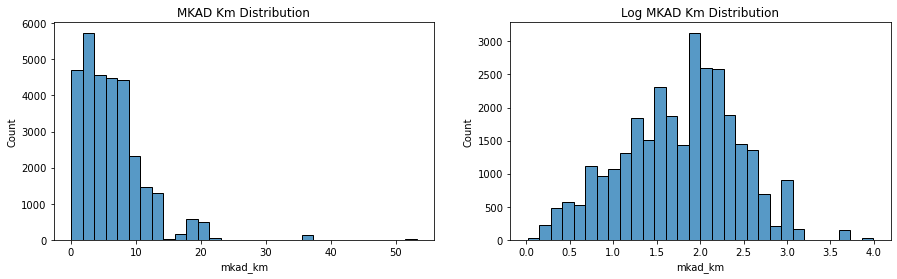

In [140]:
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

#гистограмма исходного признака
histplot = sns.histplot(df['mkad_km'], bins=30, ax=axes[0])
histplot.set_title('MKAD Km Distribution');

#гистограмма в логарифмическом масштабе
log_mkad_km= np.log(df['mkad_km'] + 1)
histplot = sns.histplot(log_mkad_km , bins=30, ax=axes[1])
histplot.set_title('Log MKAD Km Distribution');

In [141]:
fig = make_subplots(rows=1, cols=2)

x1 =df['mkad_km']
fig.add_trace(
    go.Histogram(x=x1), row=1, col=1
)
log_mkad_km = np.log(df['mkad_km']+1)
x2 = log_mkad_km
fig.add_trace(
    go.Histogram(x=x2), row=1, col=2
)
fig.show()

In [142]:
def outliers_z_score(data, feature, log_scale=False):
    if log_scale:
        x = np.log(data[feature]+1) #логарифмируем, потому что распределение логнормальное
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - 3 * sigma
    upper_bound = mu + 3 * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    return outliers, cleaned

In [143]:
def outliers_z_score_mod(data, feature, log_scale=False, left=3, right=3):
    if log_scale:
        x = np.log(data[feature]+1) #логарифмируем, потому что распределение логнормальное
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    return outliers, cleaned

In [144]:
outliers, cleaned = outliers_z_score(df, 'mkad_km', log_scale=True)
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу z-отклонения: 33
Результирующее число записей: 30438


In [145]:
print(outliers['sub_area'].unique()) # В каких районах z-метод показывает выбросы по квартирам

['Poselenie Rogovskoe' 'Poselenie Kievskij']


Возможно, мы не учли того факта, что наш логарифм распределения всё-таки не идеально нормален и в нём присутствует некоторая асимметрия. Возможно, стоит дать некоторое «послабление» на границы интервалов? Давайте отдельно построим гистограмму прологарифмированного распределения, а также отобразим на гистограмме вертикальные линии, соответствующие среднему (центру интервала в методе трёх сигм) и границы интервала

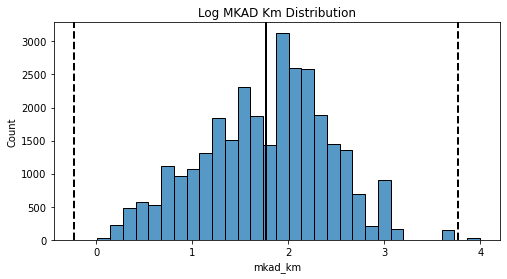

In [146]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
log_mkad_km = np.log(df['mkad_km'] + 1)
histplot = sns.histplot(log_mkad_km, bins=30, ax=ax)
histplot.axvline(log_mkad_km.mean(), color='k', lw=2)
histplot.axvline(log_mkad_km.mean()+ 3 * log_mkad_km.std(), color='k', ls='--', lw=2)
histplot.axvline(log_mkad_km.mean()- 3 * log_mkad_km.std(), color='k', ls='--', lw=2)
histplot.set_title('Log MKAD Km Distribution');

In [147]:
outliers, cleaned = outliers_z_score_mod(df, 'mkad_km',right=3.5, log_scale=True)
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу z-отклонения: 0
Результирующее число записей: 30471


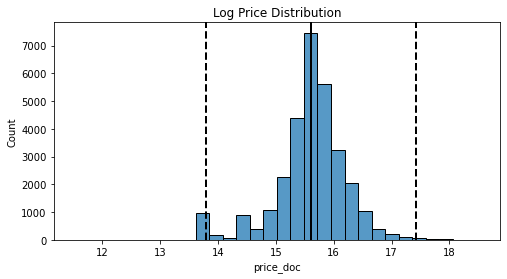

In [148]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
log_mkad_km = np.log(df['price_doc'] + 1)
histplot = sns.histplot(log_mkad_km, bins=30, ax=ax)
histplot.axvline(log_mkad_km.mean(), color='k', lw=2)
histplot.axvline(log_mkad_km.mean()+ 3 * log_mkad_km.std(), color='k', ls='--', lw=2)
histplot.axvline(log_mkad_km.mean()- 3 * log_mkad_km.std(), color='k', ls='--', lw=2)
histplot.set_title('Log Price Distribution');

In [149]:
outliers, cleaned = outliers_z_score_mod(df, 'price_doc',right=3.7,left=3.7, log_scale=True)
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу z-отклонения: 52
Результирующее число записей: 30419


In [150]:
def outliers_iqr_log(data, feature, left=1.5, right=1.5, log_scale=False):
    if log_scale:
        x = np.log(data[feature]) #логарифмируем, потому что распределение логнормальное
    else:
        x = data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75),
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * left)
    upper_bound = quartile_3 + (iqr * right)
    outliers = data[(x<lower_bound) | (x > upper_bound)]
    cleaned = data[(x>lower_bound) & (x < upper_bound)]
    return outliers, cleaned

In [151]:
outliers, cleaned = outliers_iqr_log(df, 'price_doc',right=3,left=3, log_scale=True)
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу z-отклонения: 92
Результирующее число записей: 30379


# Дубликаты

In [152]:
df['id'].nunique() == df.shape[0]

True

In [153]:
dupl_columns = list(df.columns)
dupl_columns.remove('id')

mask = df.duplicated(subset=dupl_columns) #ищутся полные дубликаты по умолчанию
df_duplicates = df[mask]
print(f'Число найденных дубликатов:{df_duplicates.shape[0]}')

Число найденных дубликатов:562


In [154]:
df_duplicates

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
257,258,44,20.0,8.0,Pechatniki,2936.0,5,5791.0,5,0,...,0.882085,1.186001,0.422633,2.291423,0.686464,7.067698,3.776489,excellent,0,6200000
443,444,44,27.0,1.0,Severnoe Medvedkovo,3916.0,4,7595.0,4,0,...,0.732302,1.746865,0.291782,0.936937,0.463655,7.252920,7.352771,good,0,6000000
472,473,22,14.0,9.0,Dmitrovskoe,1208.0,4,5671.0,4,0,...,0.903281,0.646299,0.157564,1.597722,1.259593,16.747885,8.065839,poor,0,3500000
599,600,37,22.0,4.0,Bogorodskoe,3107.0,7,7277.0,9,0,...,0.594123,0.473285,0.055978,1.479723,0.724203,5.340694,5.006628,poor,0,6000000
788,789,37,22.0,4.0,Bogorodskoe,3107.0,7,7277.0,9,0,...,0.594123,0.473285,0.055978,1.479723,0.724203,5.340694,5.006628,poor,0,6000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30319,30322,39,NaN,6.0,Solncevo,3953.0,5,9700.0,5,0,...,1.052999,0.509985,0.044599,3.407720,2.002973,8.634607,4.896656,good,0,4620233
30322,30325,62,NaN,9.0,Poselenie Vnukovskoe,NaN,0,NaN,0,0,...,4.338453,1.339078,1.234235,1.192543,1.186621,13.459593,9.890758,no data,0,7194232
30388,30391,38,19.0,4.0,Nekrasovka,2395.0,5,7377.0,5,0,...,5.003990,1.687541,0.265093,3.206347,0.964153,8.630890,6.958959,good,0,3640798
30425,30428,64,NaN,13.0,Solncevo,3953.0,5,9700.0,5,0,...,1.052999,0.509985,0.044599,3.407720,2.002973,8.634607,4.896656,good,0,6418251


In [155]:
df_dedupped = df.drop_duplicates(subset=dupl_columns)
print(f'Результирующее число записей:{df_dedupped.shape[0]}')

Результирующее число записей:29909


In [156]:
low_information_cols = []

#цикл по всем столбцам
for col in df.columns:
    #наибольшая относительная частота в признаке
    top_freq = df[col].value_counts(normalize=True).max()
    #доля уникальных значений от размера признака
    nunique_ratio = df[col].nunique() / df[col].count()
    # сравниваем наибольшую частоту с порогом
    if top_freq > 0.95:
        low_information_cols.append(col)
        print(f'{col}: {round(top_freq*100, 2)}% одинаковых значений')
    # сравниваем долю уникальных значений с порогом
    if nunique_ratio > 0.95:
        low_information_cols.append(col)
        print(f'{col}: {round(nunique_ratio*100, 2)}% уникальных значений')

id: 100.0% уникальных значений
oil_chemistry_raion: 99.03% одинаковых значений
railroad_terminal_raion: 96.27% одинаковых значений
nuclear_reactor_raion: 97.17% одинаковых значений
big_road1_1line: 97.44% одинаковых значений
mosque_count_1000: 98.08% одинаковых значений


In [157]:
information_df = df.drop(low_information_cols, axis = 1)
print(f'Результирующее число признаков: {information_df.shape[1]}')

Результирующее число признаков: 55


# Повторение на другом датасете

In [158]:
hospital_data = pd.read_csv('Data/diabetes_data/diabetes_data.csv')
hospital_data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,Gender
0,6,98,58,33,190,34.0,0.430,43,0,Female
1,2,112,75,32,0,35.7,0.148,21,0,Female
2,2,108,64,0,0,30.8,0.158,21,0,Female
3,8,107,80,0,0,24.6,0.856,34,0,Female
4,7,136,90,0,0,29.9,0.210,50,0,Female


In [159]:

hospital_without_duplicates = hospital_data.drop_duplicates()
print(f'Результирующее число строк без дупликатов:{hospital_without_duplicates.shape[0]}')

Результирующее число строк без дупликатов:768


In [160]:
low_information_cols = []

#цикл по всем столбцам
for col in hospital_data.columns:
    #наибольшая относительная частота в признаке
    top_freq = hospital_data[col].value_counts(normalize=True).max()
    #доля уникальных значений от размера признака
    nunique_ratio = hospital_data[col].nunique() / hospital_data[col].count()
    # сравниваем наибольшую частоту с порогом
    if top_freq > 0.95:
        low_information_cols.append(col)
        print(f'{col}: {round(top_freq*100, 2)}% одинаковых значений')
    # сравниваем долю уникальных значений с порогом
    if nunique_ratio > 0.95:
        low_information_cols.append(col)
        print(f'{col}: {round(nunique_ratio*100, 2)}% уникальных значений')


Gender: 100.0% одинаковых значений


In [161]:
information_df_hospital = hospital_without_duplicates.drop(low_information_cols, axis=1)
information_df_hospital

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,98,58,33,190,34.0,0.430,43,0
1,2,112,75,32,0,35.7,0.148,21,0
2,2,108,64,0,0,30.8,0.158,21,0
3,8,107,80,0,0,24.6,0.856,34,0
4,7,136,90,0,0,29.9,0.210,50,0
...,...,...,...,...,...,...,...,...,...
763,5,139,64,35,140,28.6,0.411,26,0
764,1,96,122,0,0,22.4,0.207,27,0
765,10,101,86,37,0,45.6,1.136,38,1
766,0,141,0,0,0,42.4,0.205,29,1


In [162]:
def get_nan(data):
    if data == 0:
        data = np.nan
    return data
for c in information_df_hospital.columns:
  information_df_hospital[c] =  information_df_hospital[c].apply(get_nan)

In [163]:
information_df_hospital.isnull().mean()*100

Pregnancies                 14.453125
Glucose                      0.651042
BloodPressure                4.557292
SkinThickness               29.557292
Insulin                     48.697917
BMI                          1.432292
DiabetesPedigreeFunction     0.000000
Age                          0.000000
Outcome                     65.104167
dtype: float64

In [164]:
n = information_df_hospital.shape[0]
thresh = n*0.7
information_df_hospital = information_df_hospital.dropna(how='any', thresh=thresh, axis=1)
information_df_hospital.shape[1]

7

In [166]:
m = information_df_hospital.shape[1] - 2
information_df_hospital = information_df_hospital.dropna(how='any', thresh=m, axis=0)
information_df_hospital.shape[0]
information_df_hospital.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'BMI',
       'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [167]:
values = {
    'Pregnancies' : information_df_hospital['Pregnancies'].median(),
    'Glucose' : information_df_hospital['Glucose'].median(),
    'BloodPressure' : information_df_hospital['BloodPressure'].median(),
    'SkinThickness': information_df_hospital['SkinThickness'].median(),
    'BMI' : information_df_hospital['BMI'].median(),
    'DiabetesPedigreeFunction' : information_df_hospital['DiabetesPedigreeFunction'].median(),
    'Age' : information_df_hospital['Age'].median()
}
information_df_hospital = information_df_hospital.fillna(values)
information_df_hospital.mean()

Pregnancies                   4.424202
Glucose                     121.856383
BloodPressure                72.394947
SkinThickness                29.110372
BMI                          32.431117
DiabetesPedigreeFunction      0.473757
Age                          33.381649
dtype: float64

In [168]:
def iqr(data, feature, log_scale=False, left = 1.5, right = 1.5):
    if log_scale:
        x = np.log(data[feature])
    else:
        x = data[feature]
    quartile_1, quartile_2 = data[feature].quantile(0.25), data[feature].quantile(0.75)
    iqr = quartile_2 - quartile_1
    low = quartile_1 - left * iqr
    up = quartile_2 + right * iqr
    outliers = data[(x<low) | (x > up)]
    cleaned = data[(x>low) & (x < up)]
    return outliers, cleaned

In [169]:
outliers, cleaned = iqr(information_df_hospital, 'SkinThickness',right=1.5,left=1.5, log_scale=False)
print(f'Число выбросов по методу iqr: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу iqr: 81
Результирующее число записей: 671


In [170]:
def outliers_z_score_mod(data, feature, log_scale=False, left=3, right=3):
    if log_scale:
        x = np.log(data[feature]) #логарифмируем, потому что распределение логнормальное
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    return outliers, cleaned

In [171]:
outliers, cleaned = outliers_z_score_mod(information_df_hospital, 'SkinThickness',right=3,left=3, log_scale=False)
print(f'Число выбросов по методу z: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу z: 4
Результирующее число записей: 748


In [173]:
outliers, cleaned = iqr(information_df_hospital, 'DiabetesPedigreeFunction',right=1.5,left=1.5, log_scale=False)
print(f'Число выбросов по методу iqr: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу iqr: 29
Результирующее число записей: 723


In [174]:
outliers, cleaned = iqr(information_df_hospital, 'DiabetesPedigreeFunction',right=1.5,left=1.5, log_scale=True)
print(f'Число выбросов по методу iqr: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу iqr: 620
Результирующее число записей: 132


In [176]:
fig = px.histogram(information_df_hospital.DiabetesPedigreeFunction)
fig.show()